# day 392

In [1]:
import numpy as np
import sympy as sym
from IPython.display import display,Math
sym.init_printing()
import matplotlib.pyplot as plt

# Quadratic Form

* It is just a simple idea of pre and post multiplying a matrix with some vector: v.T@M@v.
## Algebraic perspective:
![sfsfs](images/210624_lin.png)

* The above expression w.T@S@w is the Quadratic form 
* the final output would just boil down to a single element.
* Quadratic form can be defined as the Energy in matrix S at each coordinate of vector w.
* it tells the amount of energy stored in the matrix at the coordinates of W.

In [4]:
# code;

# get the quadratic form
S = np.array([[2,4],
              [0,3]])
w = np.array([[3],
              [-1]])

qf = w.T@S@w
qf# 9 is the amount of energy in the matrix at the coordinates of [3,-1]

array([[9]])

## Algebraic perspective of Quadtratic form of a matrix:
![sfsfs](images/210624_lin1.png)

* This ax^2 + (b+c)xy + dy^2 form gives it its name:quadratic form.
* finding out whether that Energy in the matrix is positive or negative is all we are interested in.


![sfsdf](images/210624_lin2.png)
* Look at how the energy of the matrix is scaled up or down by the values in w while the values in the matrix remain the same.

![sfsfs](images/210624_lin3.png)
* x^2 and y^2 could take large numbers but their sign depends on the elements of the matrix(a,d). x and y since they get squared will always be positive.

## quadratic form for a symmetric matrix:
![sfsfs](images/210624_lin4.png)
* S.T == S for symmetric matrices.
* but quadratic form could also apply to non-symmetric matrices.

![sfsfs](images/210624_lin5.png)
* b and c becomes just 2b if the matrix was symmetric.

## quadratic form for a matrix of size 3*3:
![sfsfs](images/210624_lin6.png)


## quadratic form of an identity matrix:
![sfsfs](images/210624_lin7.png)
* so the vector elements are just squared and summed in case the matrix is an identity matrix.
* so, the elements of the matrix seem to affect the signs and scale the results of the vector right? that when elements of the matrix are just 1's diagonally and 0's off-diagonally we get this sum(x^2 + y^2) of the vector.

## video reference: 
[video](https://www.udemy.com/course/linear-algebra-theory-and-implementation/learn/lecture/11043738?start=30#overview)

In [5]:
# code;

# get the quadratic form
S = np.array([[1,3,-2],
              [0,3,4],
              [-5,-2,4]])
w = np.array([[-2],
              [4],
              [3]])

qf = w.T@S@w
qf # the energy of the matrix at the coordinates of [-2,4,3] is 130.

array([[130]])

In [6]:
# get the quadratic form
S = np.array([[1,3,-2],
              [0,3,4],
              [-5,-2,4]])
w = np.array([[0],
              [0],
              [0]])

qf = w.T@S@w
qf # the energy of the matrix at the coordinates of [0,0,0] is 0.

array([[0]])

In [7]:
# get the quadratic form
S = np.array([[1,3,-2],
              [0,3,4],
              [-5,-2,4]])
w = np.array([[1],
              [1],
              [1]])

qf = w.T@S@w
qf # the energy of the matrix at the coordinates of [1,1,1] is 6.

array([[6]])

# day 393,394

In [1]:
import numpy as np
import sympy as sym
from IPython.display import display,Math
sym.init_printing()
import matplotlib.pyplot as plt

## Geometric Interpretation of Quadratic Form:
![sfsf](images/250624_lin.png)

* the yellow ball is produced from using the coordinates of the vector w_{i,j}, and the red ball is the produce of the coordinates from the vector w_{k,l}.
* w.T@S@w gives the matrix energy which is represented as height in 3d space, for example 4 and -2 are used to put the ball in the correct z axis in the above picture.


![sfsdf](images/260624_lin.png)
* all those points for different vectors for the same matrix when put together create this 2D object in 2D space for a 2D matrix(a matrix representing height,width).
* Geometry for higher dimensional matrices which are tensors cannot be visualized or comprehended with our puny 3D mind.

## Different matrices producing different shapes:
![sffs](images/260624_lin1.png)
* Different matrices capable of conjuring different unique objects.
* some matrix can give out only positive qudratic energy and some only negative and for some it is both positive and negative; look at the axis of quadratic energy in the pictures.

## Understand the link between Quadratic Form and Matrix Energy:
* notice for height and width we use the vectors w1 and w2 and for the height of the object we use the output which is matrice's energy or quadratic energy stored in the matrix.
* a weird cartoonish analogy: lets imagine the space as a table and the matrix is a magical orb placed on the table. As you move the orb around different places on the table(different coordiantes, different vector points) the orb is able to carve out a beautiful looking object that is specific only to the orb meaning different kinds of orbs are capable of carving out different objects and no two orb/matrix is going to conjure the same object.
* matrix energy is just the height of these plots.

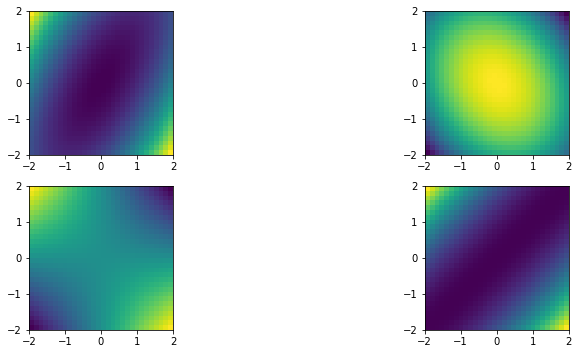

In [5]:
# code:

# some different matrices
S = np.zeros((4,), dtype=object)

S[0] = np.array([ [ 4, 4], [4, 9] ])
S[1] = np.array([ [-4,-1], [3,-5] ])
S[2] = np.array([ [ 0, 1], [2, 0] ])
S[3] = np.array([ [ 1, 1], [1, 1] ])

# range for vector w
n = 30
wRange = np.linspace(-2,2,n)

# initialize quadratic form matrix
qf = np.zeros( (n,n) )

plt.figure(figsize=(14,5))
for i in range(4):
    
    # compute QF
    for xi in range(n):
        for yi in range(n):
            # this w
            w = np.transpose([ wRange[xi], wRange[yi] ])
            
            # QF
            qf[xi,yi] = w.T@S[i]@w
    
    # show the map
    plt.subplot(2,2,i+1)
    plt.imshow(qf,extent=[wRange[0],wRange[-1],wRange[0],wRange[-1]])

plt.tight_layout(pad=1)
plt.show()

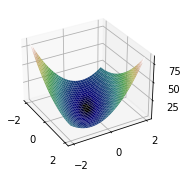

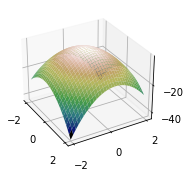

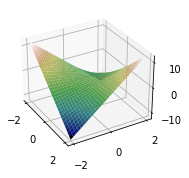

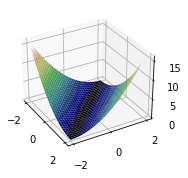

In [6]:
# 3D plotting code


mycmap = plt.get_cmap('gist_earth')
X,Y = np.meshgrid(wRange,wRange)

for i in range(4):
    
    for xi in range(n):
        for yi in range(n):
            w = np.array([ wRange[xi], wRange[yi] ])
            qf[xi,yi] = w.T@S[i]@w
    
    # show the map 
    fig = plt.figure(figsize=(16,6))
    ax1 = fig.add_subplot(221+i, projection='3d')
    surf1 = ax1.plot_surface(X, Y, qf.T, cmap=mycmap)
    ax1.view_init(azim=-30, elev=30)

plt.show()

In [7]:
# for interactive 3D plotting 
import plotly.graph_objs as go
X,Y = np.meshgrid(wRange,wRange)

for i in range(4):
    
    for xi in range(n):
        for yi in range(n):
            w = np.array([ wRange[xi], wRange[yi] ])
            qf[xi,yi] = w.T@S[i]@w
    
    # show the map 
    fig = go.Figure(data=go.Surface(z=qf.T,x=X,y=Y))
    fig.show()



# day 395

# Normalizing the quadratic form


## understand why maximizing or minimizing energy in the quadratic form is Trivial:

![sfsdf](images/260624_lin2.png)
* In which direction of the object produced by the matrix does the energy maximizes to? and what value does it maximizes to?
* Energy maximizes to Infinity in all directions.

## 3 options for the qudratic energy of the matrix:
![sfsdf](images/260624_lin1.png)
1. it will go +infinity.
2. it will go to -infinity.
3. it will stay at zero forever(as in the 4th graph which is in lower bottom to the right).

## what scales this matrix to infinities?
![sfsdf](images/260624_lin3.png)
* it is w the vector that the matrix is scaled by that scales the matrix to +infinity, -infinity, or keep it stabilized at 0.
* lets say you have identity matrix instead of a matrix with some numbers, even then that identity matrix would be streched to infinities based on the values the vector w is going to have in it.

## what does it mean for the qudratic energy value we get out of the computation?
* it is just scaled energy of the matrix by the magnitude of the vector.
* so in order to truly get the actual energy we need to normalize the qudratic form by the vector's magnitude


## know how to normalize the quadratic form to find non-trivial solutions:
![sdfsdf](images/260624_lin4.png)

* normalized quadratic form is useful in PCA and linear classification in machine learning.

## video reference:
[watch this video for better understanding](https://www.udemy.com/course/linear-algebra-theory-and-implementation/learn/lecture/11043742#overview)

In [1]:
import numpy as np
import sympy as sym
from IPython.display import display,Math
sym.init_printing()
import matplotlib.pyplot as plt
import plotly.graph_objs as go

In [26]:
# code challenge: visualize the Raw quadratic form and Normalized quadratic form side by side
A = np.array([[-1,3],
              [2,9]])

n = 100
vector_space = np.linspace(-2,2,n)

raw_quadratic_form = np.zeros((n,n))
normalized_quadratic_form = np.zeros((n,n))

X,Y = np.meshgrid(vector_space,vector_space)

for i in range(n):
    for j in range(n):
        w = np.array([vector_space[i],vector_space[j]])
        raw_quadratic_form[i,j] = w.T@A@w
        normalized_quadratic_form[i,j] = (w.T@A@w) / (w.T@w)
        
fig1 = go.Figure(data=go.Surface(z=raw_quadratic_form.T,x=X,y=Y))
fig1.update_layout(title='raw quadratic form')
fig1.update_layout(scene=dict(zaxis_title_text='Energy'))
fig1.show()

fig2 = go.Figure(data=go.Surface(z=normalized_quadratic_form.T,x=X,y=Y))
fig2.update_layout(title='normalized quadratic form')
fig2.update_layout(scene=dict(zaxis_title_text='Energy'))
fig2.show()        

* why is there a gap/hole of some sort in the normalized qudratic form of the matrix? it seems to originate at when x=0,y=0 and z=0 at which points in raw quadratic form the matrix was flat meaning at those coordiantes in the raw quadratic form the matrix was not streching anywhere but stay constant as opposed to what the edges do.

In [7]:
[vector_space[0],vector_space[0]]

In [9]:
np.transpose([vector_space[0],vector_space[0]])

array([-2., -2.])

In [11]:
raw_quadratic_form.shape

# conclusion:
* why normalizing a quadratic form?
* In raw quadratic form the sides of the object seem to stretch to infinity. the top layer to positive infinity. the sagging bottom layer to negative infinity and the saddle point(0) at the centre.
* In normalized quadratic form however the object is flattened. it is not getting to streched to infinity, the sides are flattened and the Energy also seem to range between -2 and 8. so the Energy in the normalized quadratic form 'maximizes' to a particular value instead of getting streched along all over the place as in raw form 


# Eigen vectors and the quadratic form surface:


## see the connection between the normalized quadratic form and Eigen vectors of a symmetric matrix:
![fsfs](images/270624_lin.png)

* The red/orange/yellow color of the plot indicates peak(direction of maximum). The Blue/cyan/violet color of the plot indicates trough(direction of minimum).
* the eigen vector associated with the largest eigen value points in the direction of the peak/ridge in the normalized quadratic form of the matrix.
* the eigen vector associated with the smallest eigen values points in the direction of the trough/valley in normalized qudratic form of the matrix.
* so, the eigen values and vectors act like a compass in the object space produced by a symmetric matrix to help us navigate to the maximum or minimum in the object space.

### the below code is made possible with the help of chatGPT

In [2]:
import numpy as np
import plotly.graph_objs as go

# Generate a symmetric matrix
A = np.random.randint(0, 9, (2, 2))
A = A.T @ A

# Range for vector w
n = 100
wRange = np.linspace(-2, 2, n)

# Initialize quadratic form matrix
qf = np.zeros((n, n))

# Compute QF
for i in range(n):
    for j in range(n):
        # This w
        w = np.transpose([wRange[i], wRange[j]])

        # QF
        qf[i, j] = (w.T @ A @ w) / (w.T @ w)

# Compute eigendecomposition
eig_values, eig_vectors = np.linalg.eig(A)

# Prepare the surface plot
X, Y = np.meshgrid(wRange, wRange)
fig = go.Figure(data=go.Surface(z=qf.T, x=X, y=Y))
fig.update_layout(title='Normalized quadratic form')
fig.update_layout(scene=dict(zaxis_title_text='Energy'))

# Add eigenvectors as scatter plots
for i in range(2):
    eig_vec_x = [0, eig_vectors[0, i]]
    eig_vec_y = [0, eig_vectors[1, i]]
    eig_vec_z = [np.max(qf), np.max(qf)]  # Eigenvectors lie on the XY plane in this example

    fig.add_trace(go.Scatter3d(
        x=eig_vec_x,
        y=eig_vec_y,
        z=eig_vec_z,
        mode='lines',
        line=dict(width=5),
        name=f'Eigenvector {i+1}'
    ))

fig.show()


In [40]:
np.max(qf)

In [44]:
eig_vectors

array([[-1.74528864, -0.97671263],
       [ 0.97671263, -1.74528864]])

In [45]:
eig_values

array([  1.376362, 104.623638])

In [48]:
sidx = np.argsort(eig_values)[::-1]
sidx

array([1, 0], dtype=int64)

In [49]:
eig_vectors[:,sidx]

array([[-0.97671263, -1.74528864],
       [-1.74528864,  0.97671263]])

# now your task is to try this for a matrix of size 3*3

In [58]:
import numpy as np
import plotly.graph_objs as go

# Generate a symmetric matrix
A = np.random.randint(0, 9, (3, 3))
A = A.T @ A

# Range for vector w
n = 30
wRange = np.linspace(-2, 2, n)

# Initialize quadratic form matrix
qf = np.zeros((n, n, n))

# Compute QF
for i in range(n):
    for j in range(n):
        for k in range(n):
            # This w
            w = np.array([wRange[i], wRange[j], wRange[k]])

            # QF
            qf[i, j, k] = (w.T @ A @ w) / (w.T @ w)

# Compute eigendecomposition
eig_values, eig_vectors = np.linalg.eig(A)

# Scale up eigenvectors
eig_vectors = eig_vectors * 2

# Prepare the isosurface plot
fig = go.Figure(data=go.Isosurface(
    x=np.tile(wRange, (n, n, 1)).flatten(), # we have flattened the surface to fit the plotly plot
    y=np.tile(np.repeat(wRange, n), (n, 1)).flatten(),
    z=np.repeat(wRange, n * n),
    value=qf.flatten(),
    isomin=0.1,
    isomax=1.0,
    surface_count=10,
    caps=dict(x_show=False, y_show=False, z_show=False),
))

fig.update_layout(title='Normalized quadratic form')
fig.update_layout(scene=dict(zaxis_title_text='Energy'))

# Add eigenvectors as scatter plots
for i in range(2):
    
    if i == 0:
        eig_vec_x = [0, eig_vectors[0, i]]
        eig_vec_y = [0, eig_vectors[1, i]]
        eig_vec_z = [0, eig_vectors[2, i]]
        fig.add_trace(go.Scatter3d(
        x=eig_vec_x,
        y=eig_vec_y,
        z=eig_vec_z,
        mode='lines',
        line=dict(width=5),
        name='dir to peak'
    ))

        
    if i == 1:
        i = i+1
        eig_vec_x = [0, eig_vectors[0, i]]
        eig_vec_y = [0, eig_vectors[1, i]]
        eig_vec_z = [0, eig_vectors[2, i]]
        eig_vec_x = [0, eig_vectors[0, i]]
        eig_vec_y = [0, eig_vectors[1, i]]
        eig_vec_z = [0, eig_vectors[2, i]]
        fig.add_trace(go.Scatter3d(
        x=eig_vec_x,
        y=eig_vec_y,
        z=eig_vec_z,
        mode='lines',
        line=dict(width=5),
        name='dir to trough'
        ))

    
fig.show()


In [55]:
sidx = np.argsort(eig_values)[::-1]
sidx

array([0, 1, 2], dtype=int64)

# day 397

In [3]:
import numpy as np
import sympy as sym
from IPython.display import display,Math
sym.init_printing()
import matplotlib.pyplot as plt
import requests
from PIL import Image
from io import BytesIO

# Application of normalized quadratic form: PCA

## see the connection between normalized quadratic form and PCA:
![ssfsd](images/290624_lin.png)
* on the left side we see a matrix with sensors output from a robot labelled as channels and Time labelled as Time.
* How do you find the interaction between each channel?
* Thus come the covariance matrix(A.A.T) which is a matrix of outproduct of the original matrix. It helps to quantify the interaction between each channels/signals.
* The covariance matrix doesn't have to be (A.A.T) it can also be A.A.T depending on whether Time comes on the y axis or x axis. if the Time was on the y axis then calculating the covariance matrix would be with A.T.A.

![ssfsd](images/290624_lin1.png)
* in the place of S put covariance matrix to get the PCA.
* remember the maximum eigen value and the corresponding eigen vector points to peak in the quadratic form of the matrix space and the minimum eigne value and the corresponding eigen vector points to the trough in the quadratic form of the matrix space.
![ssfsd](images/290624_lin2.png)
* if W was a matrix not a vector w then it would transformed as above.
* This finally gives us a eigenvalue equation where the lambda(the normalized quadratic form of the matrix) is the eigen values for it.
* W is the set of eigen vectors.

![ssfsd](images/290624_lin3.png)
* y is the prediction score in statistics.
* $W_j$ is jth component of the eigen vector. This $W_j$ is also called as weights, filter, factor.
* A is the original matrix.


## see an example of using PCA for data compression:


# day 399

In [3]:
import numpy as np
import sympy as sym
from IPython.display import display,Math
sym.init_printing()
import matplotlib.pyplot as plt
import requests
from PIL import Image
from io import BytesIO

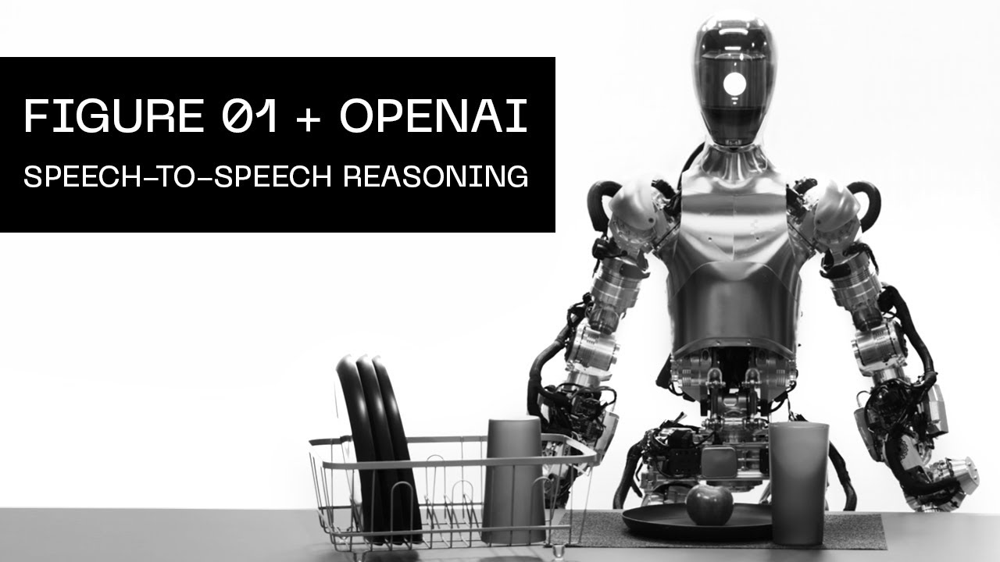

In [4]:
## code:

# relationship across channels (imposing covariance)
url = 'https://i.ytimg.com/vi/Sq1QZB5baNw/maxresdefault.jpg'
response = requests.get(url).content
image_data = BytesIO(response)

image = Image.open(image_data)

# grey image to get rid off the color dimension (so that we don't have to work with a tensor now)
data = image.convert('L')
data


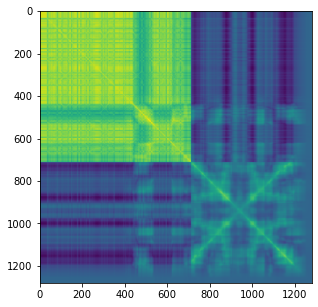

In [32]:
# convert image to numpy array
data_array = np.array(data)

# compute covariance matrix
covmat = np.cov(data_array,rowvar=False)


### show me the data!!
plt.figure(figsize=(12,5))


# show covariance matrix
plt.imshow(covmat)
plt.show()

In [39]:
# eigen decomposition
eig_values,eig_vectors = np.linalg.eig(covmat)
sidx = np.argsort(eig_values)[::-1] # reverse order
sorted_eig_values = np.real(eig_values[sidx])
sorted_eig_vectors = np.real(eig_vectors[:,sidx])

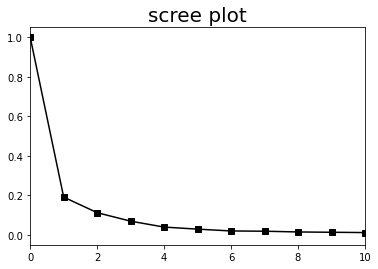

In [40]:
# how many components are explaining most of the variance in the data(robot image)

plt.plot(sorted_eig_values/np.max(sorted_eig_values),'ks-')
plt.title('scree plot',fontsize=20)
plt.xlim([0,10])
plt.show()

* I think the first 6 components are enough!

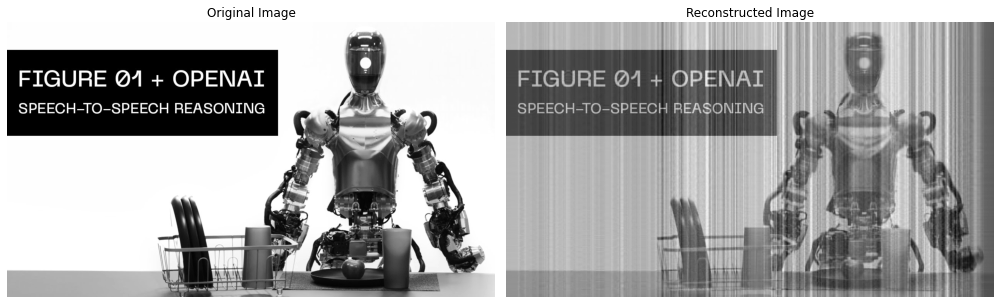

In [65]:
# Compute the projections of the original data onto the top eigenvectors.
# Reconstruct the data from these projections.

n_comps = 72

# reconstruct the image with minimal number of components
top_eig_vectors = sorted_eig_vectors[:,:n_comps]
projected_data = np.dot(data_array,top_eig_vectors) #720*1280 @ 1280 *6 = 720*6
recon_image = np.dot(projected_data,top_eig_vectors.T) # 720*6 @ 6 * 1280 = 720 * 1280 which is the original shape of the dat

# just adding some decoration
# clipped_between_range = np.clip(recon_image,0,255)
# recon_image = Image.fromarray(recon_image.astype(np.uint8))

fig,ax = plt.subplots(1,2,figsize=(14,5))

ax[0].imshow(data_array,cmap='gray')
ax[0].set_title('Original Image')
ax[0].axis('off')

ax[1].imshow(recon_image,cmap='gray')
ax[1].set_title('Reconstructed Image')
ax[1].axis('off')

plt.tight_layout()
plt.show()


## exploration, ablation-analysis and freethrows

In [7]:
covmat

array([[13234.585379  , 13234.58993973, 13234.60679184, ...,
          160.15730181,   159.74950162,   160.07414812],
       [13234.58993973, 13234.59588935, 13234.61273374, ...,
          160.1149745 ,   159.70854582,   160.03314789],
       [13234.60679184, 13234.61273374, 13234.63511049, ...,
          159.95957348,   159.55445835,   159.88027353],
       ...,
       [  160.15730181,   160.1149745 ,   159.95957348, ...,
           75.14158554,    74.33583681,    73.46940195],
       [  159.74950162,   159.70854582,   159.55445835, ...,
           74.33583681,    73.57161953,    72.70474038],
       [  160.07414812,   160.03314789,   159.88027353, ...,
           73.46940195,    72.70474038,    71.87160987]])

In [10]:
sorted_eig_vectors.shape

In [12]:
data_array.shape

In [26]:
projected_data.shape # 720*1280 @ 1280*6

In [43]:
np.clip(recon_image,0,255)

array([[202.670968  , 202.65543177, 202.59264476, ...,  17.28585522,
         17.01925863,  16.7900891 ],
       [202.670968  , 202.65543177, 202.59264476, ...,  17.28585522,
         17.01925863,  16.7900891 ],
       [202.670968  , 202.65543177, 202.59264476, ...,  17.28585522,
         17.01925863,  16.7900891 ],
       ...,
       [128.13086779, 128.12140912, 128.08431814, ...,   9.84465868,
          9.70688445,   9.57755425],
       [128.81623287, 128.80670579, 128.76922217, ...,   9.95478289,
          9.81549313,   9.6848531 ],
       [129.46268737, 129.45309906, 129.41531121, ...,  10.0422911 ,
          9.90148523,   9.76976626]])

# day 400

In [4]:
import numpy as np
import sympy as sym
from IPython.display import display,Math
sym.init_printing()
import matplotlib.pyplot as plt
import scipy
import scipy.stats as stats

# see the connection between normalized quadratic form and Generalized Eigen decomposition:
![fsfsf](images/020724_lin.png)
![fsfsf](images/020724_lin1.png)
![fsfsf](images/020724_lin2.png)
* review the lecture on Generalized eigen decomposition between 2 matrices before trying to learn this.
* $W^{T}W \neq I $ here W is the matrix of eigen vectors. so Eigen vectors are not orthogonal because if they were they would have produced an identity matrix as result of dot producting it.

# understand how vectors can be orthogonal in a matrix subspace:
*  but  $ W^{T}.R.W = I $  meaning the vectors in matrices W and R have resulted in orthogonality.
* which means in the standard space the w matrix consisting of eigen vectors are not orthogonal but in the matrix space of R they have become orthogonal

In [6]:
# create two symmetric matrices
m = 14
n = 1000

# create A as random sine-modulated noise, then its covariance matrix
# A and B matrices are made to be related because eigen decomposition is known for finding relatable variances.
A = np.zeros((m,n))
for i in range(n):
    A[:,i] = np.random.randn(m) * np.cos(np.linspace(0,np.pi,m))

A = A@A.T # A is now symmetric 


# B is the same thing, just different random numbers
B = np.zeros((m,n))
for i in range(n):
    B[:,i] = np.random.randn(m) * np.cos(np.linspace(0,np.pi,m))

B = B@B.T # B is now symmetric.


# generalized eigendecomposition
evals,evecs = scipy.linalg.eigh(A,B) # we use hermetian eigen decomposition to avoid dealing with real numbers


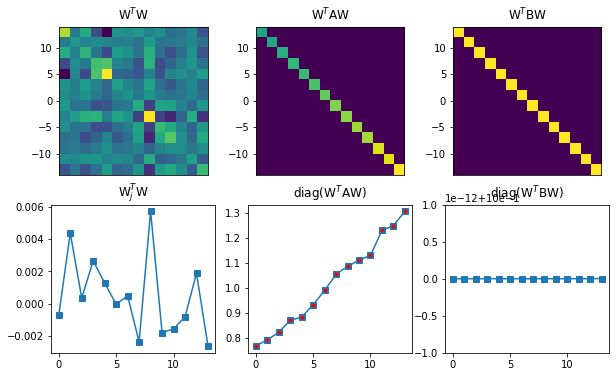

In [7]:
## some plotting
# evals,evecs = np.real(evals),np.real(evecs) # just to discard complex valued numbers for easy visualization.

fig = plt.subplots(1,figsize=(10,6))

# W'W
plt.subplot(231)
plt.imshow(evecs.T@evecs,extent=[-m,m,-m,m])
plt.xticks([])
plt.title('W$^T$W')

# one row of W'W
tmp = evecs.T@evecs
plt.subplot(234)
plt.plot(tmp[1,:],'s-')
plt.title('W$_j^T$W')

# W'AW
plt.subplot(232)
plt.imshow(evecs.T@A@evecs,extent=[-m,m,-m,m])
plt.xticks([])
plt.title('W$^T$AW')

# one row of W'AW
plt.subplot(235)
plt.plot(np.diag(evecs.T@A@evecs),'s-')
plt.plot(evals,'r.')
plt.title('diag(W$^T$AW)')

# W'BW
plt.subplot(233)
plt.imshow(evecs.T@B@evecs,extent=[-m,m,-m,m])
plt.xticks([])
plt.title('W$^T$BW')

# diagonal of W'BW
plt.subplot(236)
plt.plot(np.diag(evecs.T@B@evecs),'s-')
plt.title('diag(W$^T$BW)')

plt.show()


* W^T.B.W seem to produce Identity matrix.
* this means `quadratic form of Generalized Eigen Decomposition for matrices A and B is = W.T@A@W where W is a matrix of Eigen vectors of A and B.`

# now try for only eigen decomposition of either A or B not both

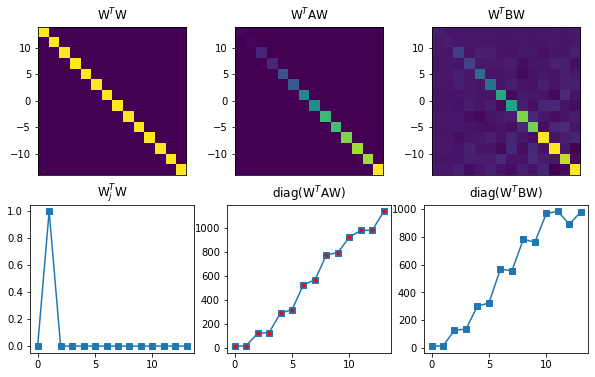

In [9]:
# generalized eigendecomposition
evals,evecs = scipy.linalg.eigh(A) # we use hermetian eigen decomposition to avoid dealing with real numbers


fig = plt.subplots(1,figsize=(10,6))

# W'W
plt.subplot(231)
plt.imshow(evecs.T@evecs,extent=[-m,m,-m,m])
plt.xticks([])
plt.title('W$^T$W')

# one row of W'W
tmp = evecs.T@evecs
plt.subplot(234)
plt.plot(tmp[1,:],'s-')
plt.title('W$_j^T$W')

# W'AW
plt.subplot(232)
plt.imshow(evecs.T@A@evecs,extent=[-m,m,-m,m])
plt.xticks([])
plt.title('W$^T$AW')

# one row of W'AW
plt.subplot(235)
plt.plot(np.diag(evecs.T@A@evecs),'s-')
plt.plot(evals,'r.')
plt.title('diag(W$^T$AW)')

# W'BW
plt.subplot(233)
plt.imshow(evecs.T@B@evecs,extent=[-m,m,-m,m])
plt.xticks([])
plt.title('W$^T$BW')

# diagonal of W'BW
plt.subplot(236)
plt.plot(np.diag(evecs.T@B@evecs),'s-')
plt.title('diag(W$^T$BW)')

plt.show()


* it is a mystery why the eigen vector(W) of eigen decomposition made with matrix A seem to give off the same pattern in diag(W.T.B.W) as in diag(W.T.A.W) though B is a completely different matrix.
* perhaps it is due to the fundamental nature of both matrices(A and B) since both cosine function in them so the eigen decomposition indeed helps to divulge some underlying patterns between things and helps us to visualize whether they got any similarity between them?
* thirdly, diag(W.T.A.W) seem to give off the same answer as evals which is the eigen values_ the red dots are eigen values.


## exploration, ablation-analysis and freethrows

In [10]:
evals

array([  13.89161795,   15.02507748,  119.96609793,  125.06215691,
        290.05017683,  317.08428261,  526.95001478,  566.34785077,
        775.01539967,  795.3941702 ,  925.06383105,  980.2775842 ,
        981.85286527, 1140.10214037])

In [12]:
np.diag(evecs.T@A@evecs)

array([  13.89161795,   15.02507748,  119.96609793,  125.06215691,
        290.05017683,  317.08428261,  526.95001478,  566.34785077,
        775.01539967,  795.3941702 ,  925.06383105,  980.2775842 ,
        981.85286527, 1140.10214037])

# day 401

# matrix definiteness and geometry of the quadratic form


## five properties of definiteness in a square matrix:
![fsfs](images/030724_lin.png)

* matrix needs to be square for it to work.
## find the relationship between these categories and eigenvalues:

In [2]:
import numpy as np
import sympy as sym
from IPython.display import display,Math
sym.init_printing()
import matplotlib.pyplot as plt

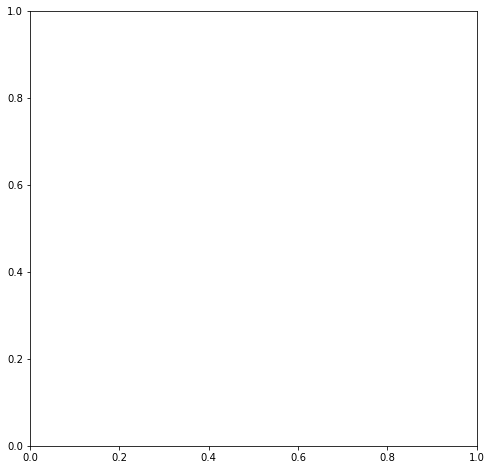

In [59]:
# some different matrices
S = np.zeros((5,),dtype=object)
S[0] = [ [ 4, 4], [ 4, 9] ]
S[1] = [ [-4,-1], [-3,-5] ]
S[2] = [ [ 0, 1], [ 2, 0] ]
S[3] = [ [ 1, 1], [ 1, 1] ]
S[4] = [ [-1,-2], [-3,-6] ]

import plotly.graph_objs as go
X,Y = np.meshgrid(wRange,wRange)



# range for vector w
n = 30
wr = 2
wRange = np.linspace(-wr,wr,n)

# initialize quadratic form matrix
qf = np.zeros( (n,n) )


fig = plt.subplots(1,figsize=(8,8))

for i in range(5):
    
    # compute QF
    for xi in range(n):
        for yi in range(n):
            # this w
            w = np.transpose([ wRange[xi], wRange[yi] ])
            
            # QF
            qf[xi,yi] = w.T@S[i]@w
    
    
    

    
    ## compute the matrix's definiteness based on the eigenvalues
    
    # get eigenvalues
    evals = np.linalg.eig(S[i])[0]
    
    # we care about their signs
    esign = np.sign(evals)
    
    # test for signs (note: this test is valid only for 2x2 matrices!)
    if sum(esign)==2:
        defcat = 'Pos. def.'
    elif sum(esign)==1:
        defcat = 'Pos. semidef.'
    elif sum(esign)==0:
        defcat = 'Indeterminant'
    elif sum(esign)==-1:
        defcat = 'Neg. semidef.'
    elif sum(esign)==-2:
        defcat = 'Neg. def.'
    
    # plot the image
    fig = go.Figure(data=go.Surface(z=qf.T,x=X,y=Y))
    fig.update_layout(title=defcat)
    fig.show()

## observation:
* for positive definite the plot was all poining up; all the edges were point up.
* for negative definite the plot was all pointing down; all the edges were pointing down.
* for indeterminate matrix the plot was both pointing up in some region and pointing down in some other.
* for positive semi definite the plot was pointing up and also it has a saddle point at zero; it is flat at zero.
* for negative semi definite the plot was pointing down and also it has a saddle point at zero; it is flat at zero at top.

## exploration, ablation-analysis and freethrows

In [7]:
S

array([list([[4, 4], [4, 9]]), list([[-4, -1], [-3, -5]]),
       list([[0, 1], [2, 0]]), list([[1, 1], [1, 1]]),
       list([[-1, -2], [-3, -6]])], dtype=object)

In [54]:
# matrix needs to be square for it to work.

rows = 3
cols = rows
a = np.random.randint(0,9,(rows,rows))

eig_values,eig_vectors = np.linalg.eig(a)

eig_values = np.real(eig_values)
eig_values

array([11.78005154,  1.7289654 ,  0.49098306])

In [55]:
esign = np.sign(eig_values)
esign

array([1., 1., 1.])

In [56]:
# test for signs (note: this test is valid only for 2x2 matrices!)
if sum(esign)==rows:
    defcat = 'Pos. def.'
elif sum(esign)== -rows:
    defcat = 'Neg. def.'
elif -1 in esign and 1 in esign:
    defcat = 'indefinite'
elif esign >= 0:
    defcat = 'pos semi def'
elif esign <= 0:
    defcat = 'neg semi def'
        
defcat

'Pos. def.'

# proof: A.T@A is always positive definite or positive semi definite:

![sfsdf](images/030724_lin1.png)
* the final equation is just the magnitude of A matrix and w vector.
* the magnitude/length cannot be negative. That is how it works.
* so, it is proved A.T@A cannot be negative either.
* This is guaranteed to produce only `postive definite matrix.`

## how to produce positive semi definite matrix?
* take a reduced rank matrix of size such as 3x2.
* and do A.T@A transformation and you will have 0 and positive numbers as eigen values 
* 0 in eigen value indicates the matrix's reduced rank state due to being rectangular originally instead of square.

## symmetric != postive definiteness or positive semi definiteness:
![sfsd](images/030724_lin2.png)
* the above matrix is symmetric but it has both positive and negative energy in quadratic form landscape meaning it is a indeterminate matrix; it may have both positve and negative eigen values.
* the matrix originally need to have been a positive definite matrix or positive semi definite matrix in order for its symmetric version to exhibit the same charecteristics.
* the study of cholesky decomposition explores this subject further.

## Test out the above ideas!!!

In [92]:
# symmetric matrix produce positive definite or positive semi definite

A = np.random.randn(5,5)
A = A.T@A

eig_values,eig_vectors = np.linalg.eig(A)
eig_values

array([9.17969263, 5.1300345 , 2.27481371, 0.01681161, 0.36328981])

In [94]:
# testing the eigen values of originally a rectangular matrix but become symmetric
A = np.random.randint(0,9,(5,3))
A = A.T@A

eig_values,eig_vectors = np.linalg.eig(A)
eig_values

array([229.6900318,  50.3720095,  22.9379587])

* it can have zeros to fill in for 4th and 5th rows in its diagonal version

## Test out when the symmetric matrix doesn't neccessarily produce positive definite or pos semi definiteness

In [111]:
A = np.array([[-9,4],
              [4,9]])
A

array([[-9,  4],
       [ 4,  9]])

In [112]:
eig_values,eig_vectors = np.linalg.eig(A)
eig_values

array([-9.8488578,  9.8488578])

* positive and negative values in eigen values indicate that the matrix is of category `indeterminate`. 
* even though the original matrix is symmetric it doen't yield only positive values in eigen values to be called positve definite or positive semi definite matrix.
* cholesky decomposition explores about this topic further.

In [113]:
# taking symmetric of that indeterminate matrix
A = A.T@A
A

array([[97,  0],
       [ 0, 97]])

In [114]:
eig_values,eig_vectors = np.linalg.eig(A)
eig_values

array([97., 97.])

## conclusion:
* even if the symmetric version of the matrix is not positive definite or pos semi definite we can take symmetric version of such matrices to produce postive definiteness or positive semi definiteness.

## exploration, ablation-analysis and freethrows

In [61]:
# testing whether making a non-square matrix symmetric and square would help it gain spatial information.
a = np.random.rand(3,2)
np.linalg.matrix_rank(a)

2

In [62]:
a = a.T@a
a

array([[1.41918693, 0.83951567],
       [0.83951567, 0.51151909]])

In [63]:
np.linalg.matrix_rank(a)

2

* the information stored in the matrix is preserved and no amount of transformation(such as making it square or symmetric) is going to help the matrix automatically gain information it doesn't originally have.

In [77]:
# testing the eigen values of originally a rectangular matrix but become symmetric
A = np.random.randint(0,9,(5,3))
A

array([[2, 4, 7],
       [6, 7, 7],
       [2, 8, 3],
       [8, 0, 8],
       [2, 1, 3]])

In [78]:
np.linalg.matrix_rank(A)

3

In [79]:
A = A.T@A
A

array([[112,  68, 132],
       [ 68, 130, 104],
       [132, 104, 180]])

In [80]:
eig_values,eig_vectors = np.linalg.eig(A)
eig_values

array([351.62006947,   8.18386008,  62.19607045])

* it can have zeros to fill in for 4th and 5th rows in its diagonal version

# proof: connection between Eigen values and matrix definiteness.
![sfsd](images/030724_lin3.png)
![sfsd](images/030724_lin4.png)
* eigen values can also contain 0 in this case.
![sfsd](images/030724_lin5.png)
* magnitude of the vector is always positive but the sign of the eigen values can be anything(+ve or -ve).

## video reference:
[watch this video to understand it better](https://www.udemy.com/course/linear-algebra-theory-and-implementation/learn/lecture/14700420#overview)
